In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import numpy as np
import scipy as sp
import theano as th
import theano.tensor as tt
import statsmodels.api as sm
import matplotlib.pyplot as plt
from IPython.html.widgets import interact
import seaborn as sb
import g3py as g3
import pymc3 as pm

np.random.seed(123456)
th.config.floatX = 'float32'
th.config.on_unused_input = 'ignore'
th.config.mode = 'FAST_RUN'

/home/grios/anaconda3/lib/python3.5/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


# Data: Sunsets

::

    Number of Observations - 309 (Annual 1700 - 2008)
    Number of Variables - 1
    Variable name definitions::

        SUNACTIVITY - Number of sunspots for each year

    The data file contains a 'YEAR' variable that is not returned by load.



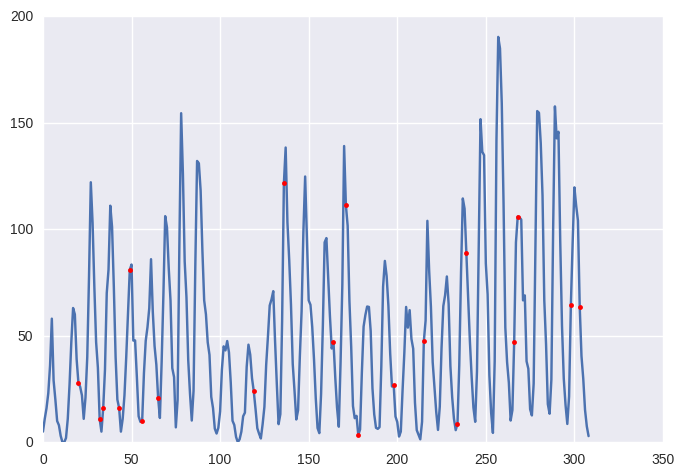

In [2]:
x, y = g3.load_sunspots()
obs_j, x_obs, y_obs, test_j, x_test, y_test = g3.random_obs(x, y, 0.15)

g3.plot(x,y)
g3.plot(x_obs,y_obs,'.r')

# Style Plots

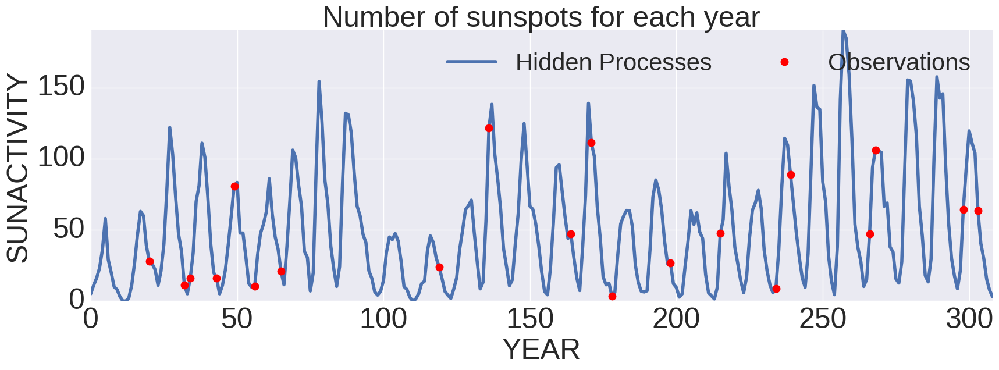

In [3]:
def plot_data_normal():
    g3.plot(x,y,label='Hidden Processes')
    g3.plot(x_obs,y_obs,'.r',label='Observations')
    g3.text_plot('Number of sunspots for each year','YEAR','SUNACTIVITY',loc=1)
def plot_data_big():
    g3.plot(x,y,linewidth=4,label='Hidden Processes')
    g3.plot(x_obs,y_obs,'.r',ms=20,label='Observations')
    g3.text_plot('Number of sunspots for each year','YEAR','SUNACTIVITY',loc=1)
    
#g3.style_seaborn()
#g3.style_normal()
#g3.style_big()
g3.style_big_seaborn()

#plot_data = plot_data_normal
plot_data = plot_data_big

plot_data()

# GP

In [15]:
with g3.Model() as model:
    tgp = g3.TGP(x, g3.Bias(), g3.SE(x_obs), g3.Identity(y_obs))
    tgp.observed(x_obs,y_obs)
    tgp.compile()
model.vars

Applied log-transform to TGP_SE_Var and added transformed TGP_SE_Var_log_ to model.
Applied log-transform to TGP_SE_ARD_L2_Scales and added transformed TGP_SE_ARD_L2_Scales_log_ to model.
Applied log-transform to TGP_Noise_Var and added transformed TGP_Noise_Var_log_ to model.


[TGP_Bias_Constant,
 TGP_SE_Var_log_,
 TGP_SE_ARD_L2_Scales_log_,
 TGP_Noise_Var_log_]

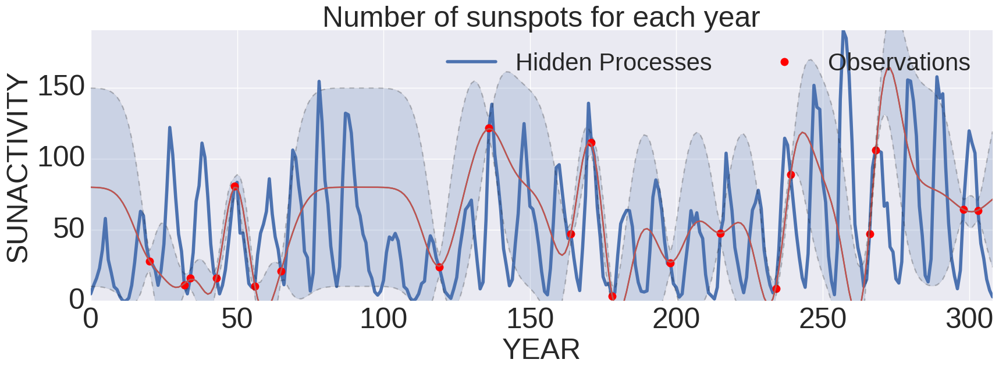

In [29]:
#SE
default = {
         'TGP_SE_ARD_L2_Scales_log_': np.log(30).astype(np.float32),
         'TGP_SE_Var_log_': np.log(10*y_obs.max()).astype(np.float32),
         'TGP_Noise_Var_log_': np.log(0.1*y_obs.max()).astype(np.float32),
         'TGP_Bias_Constant': np.abs(80).astype(np.float32)
}
plot_data()
#_ = tgp.plot_gp(default)
_ = tgp.plot_tgp_quantiles(default)
_ = tgp.plot_tgp_moments(default)

In [5]:
def plot_gp(model,**params):
    mean, variance = tgp.plot_posterior(mu, var, x,**params)
    try:
        logp_train = np.nanmean(model.logp(params))
    except:
        logp_train = np.float32(0)
    
    tgp.inputs.set_value(x_test.astype(th.config.floatX))
    tgp.outputs.set_value(x_test.astype(th.config.floatX))
    
    try:
        logp_test = np.nanmean(model.logp(params))
    except:
        logp_test = np.float32(0)
    

    tgp.inputs.set_value(x_obs.astype(th.config.floatX))
    tgp.outputs.set_value(y_obs.astype(th.config.floatX))
    
    mse = np.nanmean((y - mean) ** 2 + variance)
    mab = np.nanmean(np.abs(y - mean))
    title = 'll_train={:.2f} | ll_test={:.2f} | mse={:.2f}  | bias={:.2f}'.format(logp_train, logp_test,mse,mab)
    g3.text_plot('Standard GP: '+title,'YEAR','SUNACTIVITY',loc=1)


def plot_tgp(model,**params):
    moment1, moment2 = tgp.plot_posterior_hermite(m1,m2,x,**params)
    med, Iup, Idow = tgp.plot_posterior_quantiles(median, I_up, I_down,x,**params)
    #moment1, moment2 = m1(**params), m2(**params)
    
    mean = moment1
    variance = moment2 - moment1**2
    try:
        logp_train = np.nanmean(model.logp(params))
    except:
        logp_train = np.float32(0)
    tgp.inputs.set_value(x_test.astype(th.config.floatX))
    tgp.outputs.set_value(x_test.astype(th.config.floatX))
    logp_test = np.nanmean(model.logp(params))

    tgp.inputs.set_value(x_obs.astype(th.config.floatX))
    tgp.outputs.set_value(y_obs.astype(th.config.floatX))

    
    
    mse = np.nanmean((y - mean) ** 2 + variance)
    mab = np.nanmean(np.abs(y - mean))
    title = 'll_train={:.2f} | ll_test={:.2f} | mse={:.2f}  | bias={:.2f}'.format(logp_train, logp_test,mse,mab)
    g3.text_plot('Box-Cox GP: '+title,'YEAR','SUNACTIVITY',loc=1)
    

In [106]:
#OU
default = {
         'ARD_L1_log_': np.log(30).astype(np.float32),
         'VAR_OU_log_': np.log(10*y_obs.max()).astype(np.float32),
         'Noise_log_': np.log(0.1*y_obs.max()).astype(np.float32),
         'Mean_Constant': np.abs(80).astype(np.float32)
}

In [98]:
#RQ
default = {
         'Mean_Constant': np.abs(80).astype(np.float32),
         'Noise_log_': np.log(0.1*y_obs.max()).astype(np.float32),
         'VAR_RQ_log_': np.log(10*y_obs.max()).astype(np.float32),
         'ARD_L2_log_': np.log(30).astype(np.float32),
         'ALPHA_RQ_log_': np.log(10).astype(np.float32)
}

In [79]:
#PER
default = {
         'Mean_Constant': np.abs(80).astype(np.float32),
         'Noise_log_': np.log(0.1*y_obs.max()).astype(np.float32),
         'VAR_PER_log_': np.log(10*y_obs.max()).astype(np.float32),
         'L_PER_log_': np.log(30).astype(np.float32),
         'P_PER_log_': np.log(30).astype(np.float32)
}

{'L_PER_log_': 3.4011974,
 'Mean_Constant': 80.0,
 'Noise_log_': 2.4973292,
 'P_PER_log_': 3.4011974,
 'VAR_PER_log_': 7.1024995}

{'ARD_L2_log_': 3.4011974,
 'Mean_Constant': 80.0,
 'Noise_log_': 2.4973292,
 'VAR_SE_log_': 7.1024995}

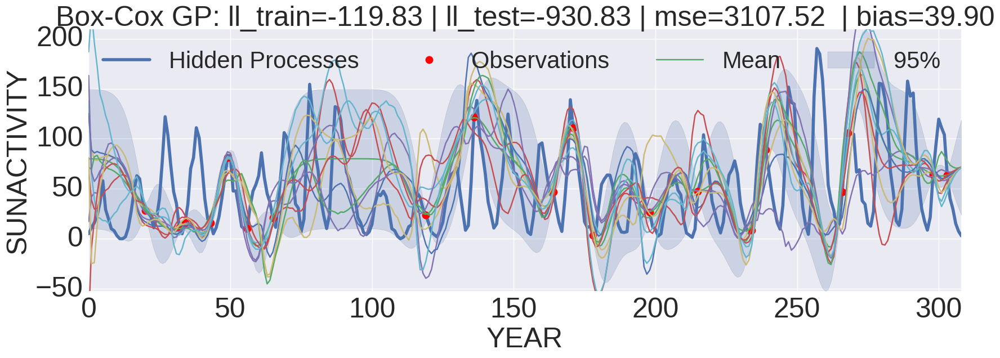

In [16]:
plot_data()
plot_tgp(model,**default)
for i in range(10):
    plt.plot(x,sampler_tgp(np.random.randn(len(x)),**default))
default

CPU times: user 3.74 s, sys: 8.9 s, total: 12.6 s
Wall time: 2.46 s
CPU times: user 2.84 s, sys: 5.14 s, total: 7.98 s
Wall time: 2.05 s
CPU times: user 4.36 s, sys: 8.61 s, total: 13 s
Wall time: 3.08 s
CPU times: user 3.78 s, sys: 8.29 s, total: 12.1 s
Wall time: 2.51 s


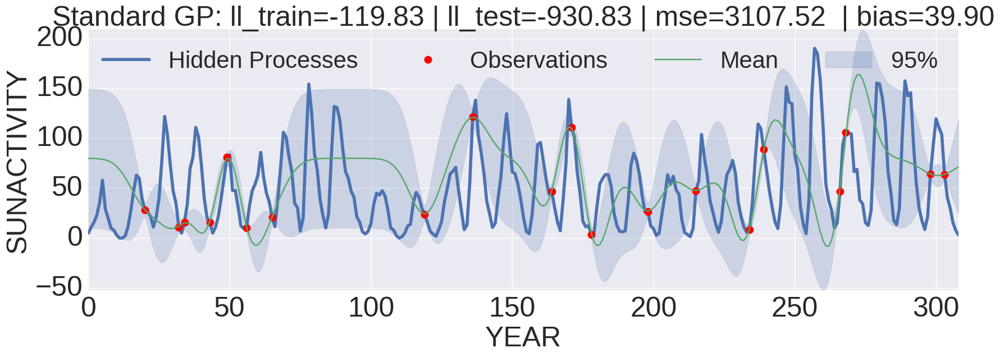

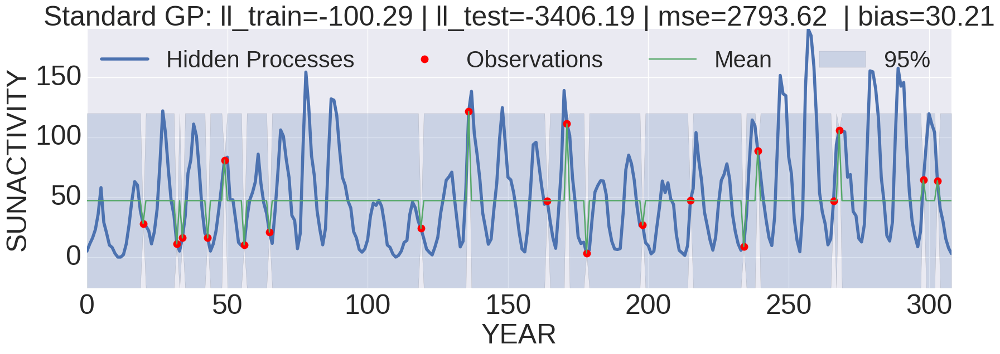

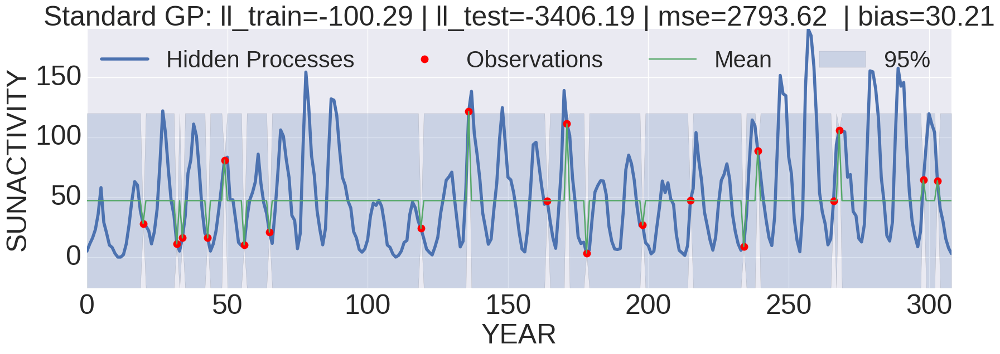

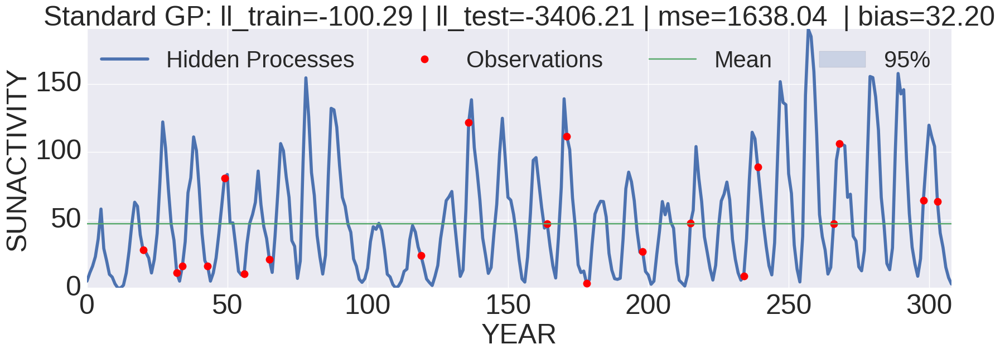

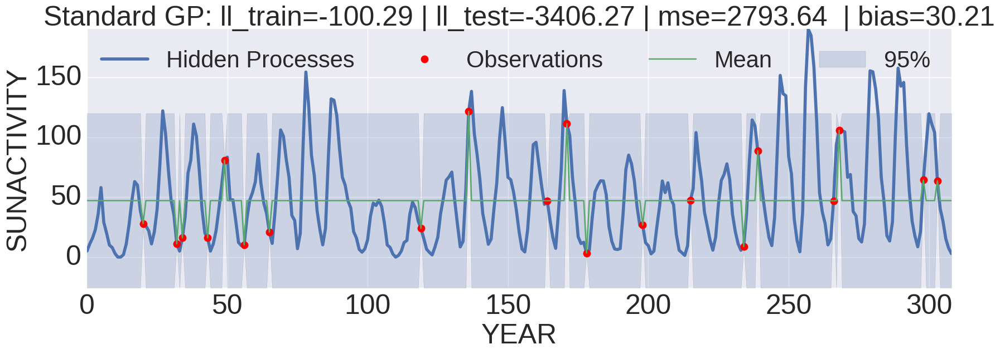

In [23]:
start = default
with model:
    #model.use_prior(False)
    try:
        %time start_bfgs = pm.find_MAP(fmin=sp.optimize.fmin_bfgs,start=start)
    except:
        start_bfgs = start
    try:
        %time new_bfgs = pm.find_MAP(fmin=sp.optimize.fmin_bfgs,start=start_bfgs,vars=[model.Noise_log_])
    except:
        new_bfgs = start_bfgs
    try:
        %time start_powell = pm.find_MAP(fmin=sp.optimize.fmin_powell,start=start)
    except:
        new_bfgs = start_bfgs
    try:
        %time new_powell = pm.find_MAP(fmin=sp.optimize.fmin_powell,start=start_bfgs)
    except:
        new_powell = start_bfgs
    

plt.figure(0)
plot_data()
plot_gp(model,**start)

plt.figure(1)
plot_data()
plot_gp(model,**start_bfgs)

plt.figure(2)
plot_data()
plot_gp(model,**new_bfgs)

plt.figure(3)
plot_data()
plot_gp(model,**start_powell)

plt.figure(4)
plot_data()
plot_gp(model,**new_powell)


{'ARD_L2_log_': 3.4011974,
 'Mean_Constant': 80.0,
 'Noise_log_': 2.4973292,
 'VAR_SE_log_': 7.1024995}

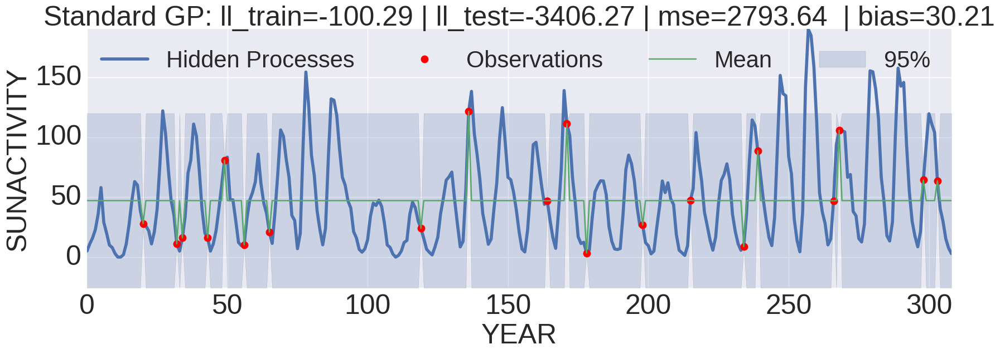

In [24]:
params = start

plt.figure(1)
plot_data()
plot_gp(model,**new_powell)
g3.save_plot('gp_learning.pdf')


params

In [156]:
with model:
    advi_mu,advi_sm,advi_elbo = pm.advi(start=params)

Iteration 0 [0%]: ELBO = -262.95
Iteration 500 [10%]: Average ELBO = -350.44
Iteration 1000 [20%]: Average ELBO = -268.29
Iteration 1500 [30%]: Average ELBO = -230.27
Iteration 2000 [40%]: Average ELBO = -208.18
Iteration 2500 [50%]: Average ELBO = -177.54
Iteration 3000 [60%]: Average ELBO = -162.19
Iteration 3500 [70%]: Average ELBO = -149.63
Iteration 4000 [80%]: Average ELBO = -141.31
Iteration 4500 [90%]: Average ELBO = -135.83
Finished [100%]: Average ELBO = -130.96


In [157]:
n = 10000
with model:
    step = pm.HamiltonianMC(scaling=advi_sm)
    trace = pm.sample(n,step=step,start=advi_mu)

100%|██████████| 10000/10000 [03:19<00:00, 50.15it/s]


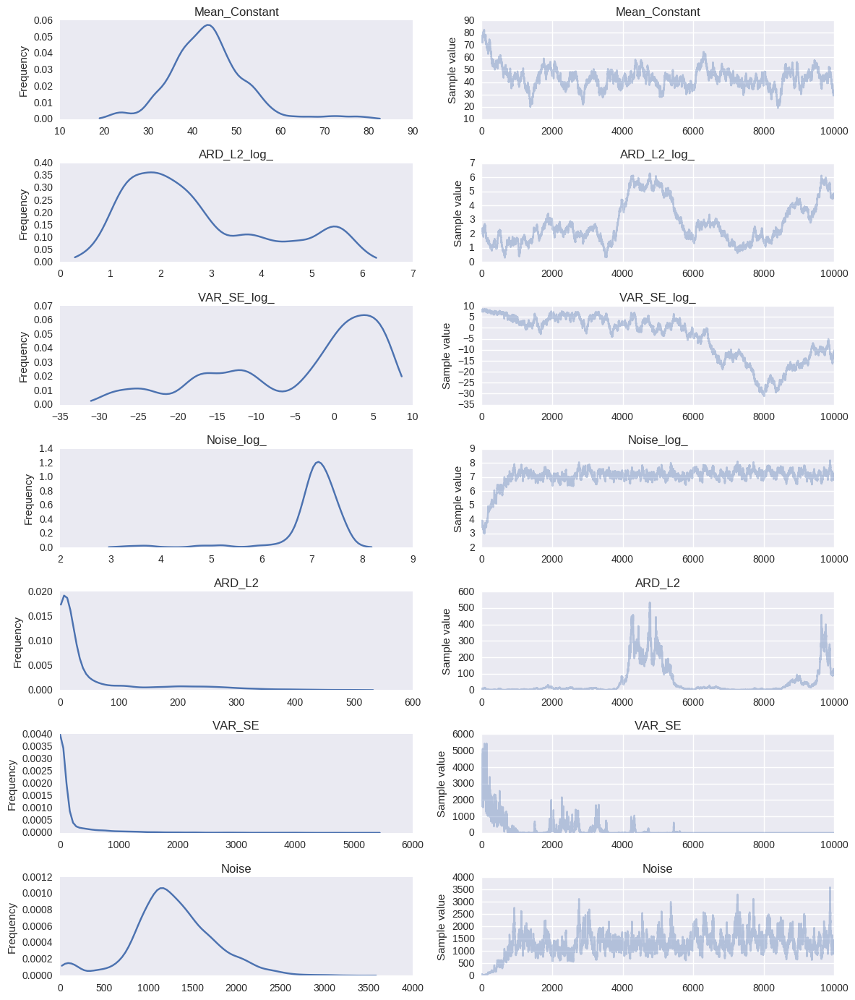

In [158]:
gp.style_seaborn()
_ = pm.traceplot(trace,plot_transformed=True)
def get_model(i):
    return {v.name:trace[i][v.name] for v in model.vars}

In [161]:
datatrace = g3.trace_to_dataframe(trace,hide_transformed_vars=False)
gp.add_likelihood_to_dataframe(model,datatrace,trace)
datatrace.describe().T

,count,mean,std,min,25%,50%,75%,max
VAR_SE,10000.0,168.328293,493.372711,3.218426e-14,0.000004,0.828859,52.521789,5440.703125
Mean_Constant,10000.0,43.608051,8.726855,1.895338e+01,38.248288,43.186975,47.965750,82.564087
Noise_log_,10000.0,7.030921,0.648833,2.966784e+00,6.922555,7.133501,7.347756,8.184452
VAR_SE_log_,10000.0,-4.348349,10.309315,-3.106730e+01,-12.394150,-0.187705,3.961228,8.601664
ARD_L2,10000.0,50.011742,87.722458,1.340867e+00,5.036672,10.107058,39.831150,532.638794
Noise,10000.0,1280.690186,474.878845,1.942933e+01,1014.909500,1253.256775,1552.708038,3584.778809
ARD_L2_log_,10000.0,2.733650,1.452362,2.933164e-01,1.616746,2.313234,3.684649,6.277843
niter,10000.0,4999.500000,2886.895680,0.000000e+00,2499.750000,4999.500000,7499.250000,9999.000000
ll,10000.0,-135.759239,1.489664,-1.472227e+02,-136.148842,-135.339973,-134.822807,-134.388626
adll,10000.0,3.217953,2.306861,3.397665e-02,1.471868,2.787799,4.502020,22.966105


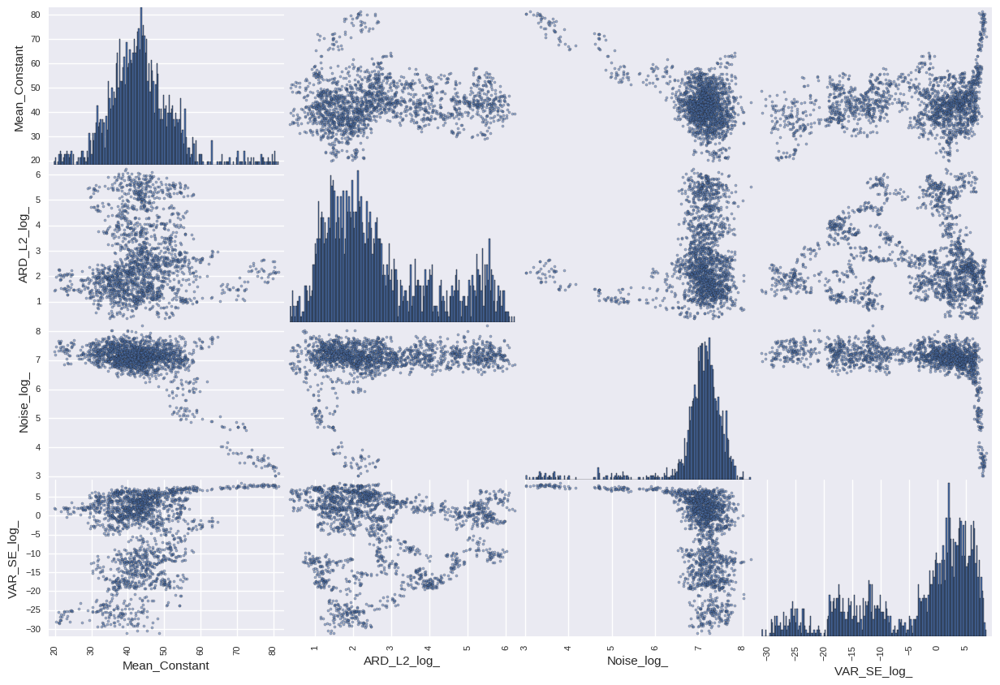

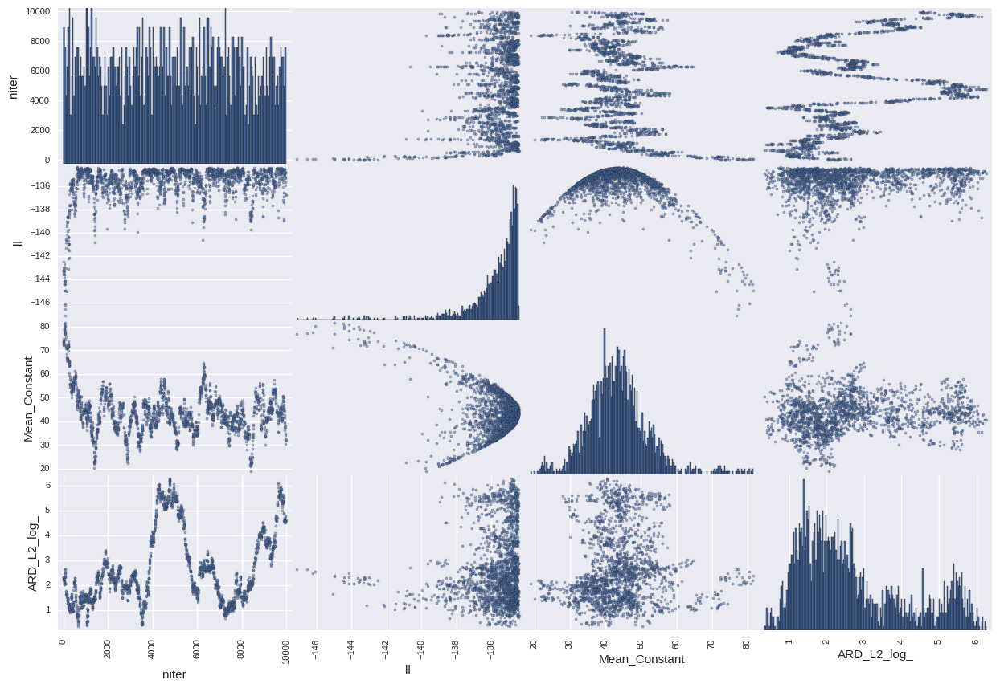

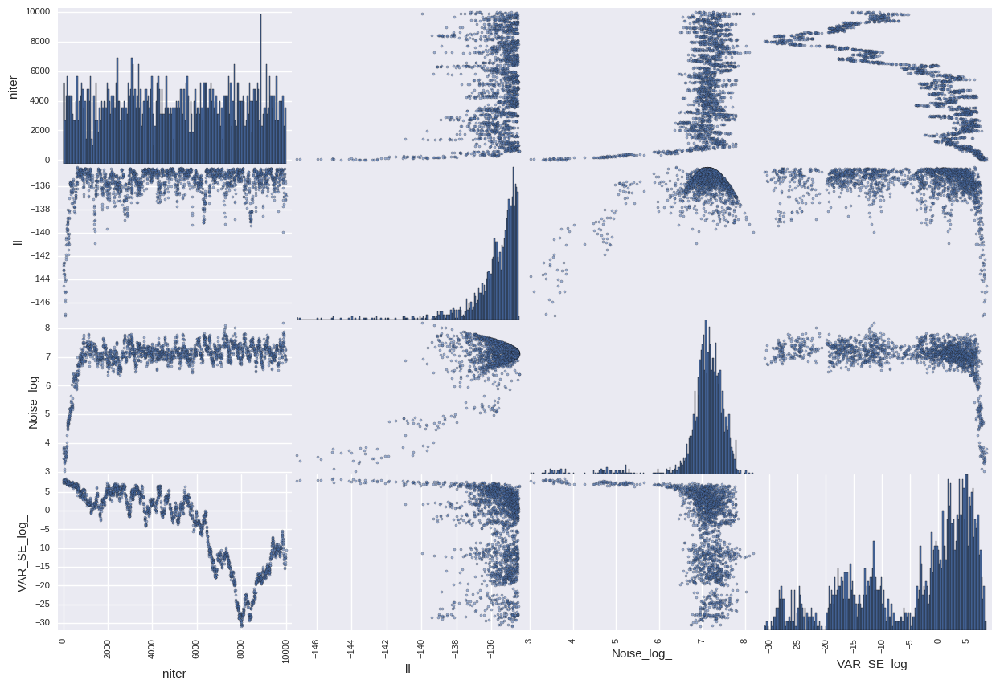

In [162]:
g3.style_seaborn()
items_ll = ['niter','ll']
items_mt = ['Mean_Constant','ARD_L2_log_']
items_k = ['Noise_log_','VAR_SE_log_']

g3.scatter_trace(datatrace,items=(items_mt+items_k))
g3.scatter_trace(datatrace,items=(items_ll+items_mt))
g3.scatter_trace(datatrace,items=(items_ll+items_k))

In [163]:
condition = lambda df: True & (df['ll'] < 100.0)
conditional_traces = g3.conditional(datatrace, condition)

#10000 (100.0 %)


/home/grios/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


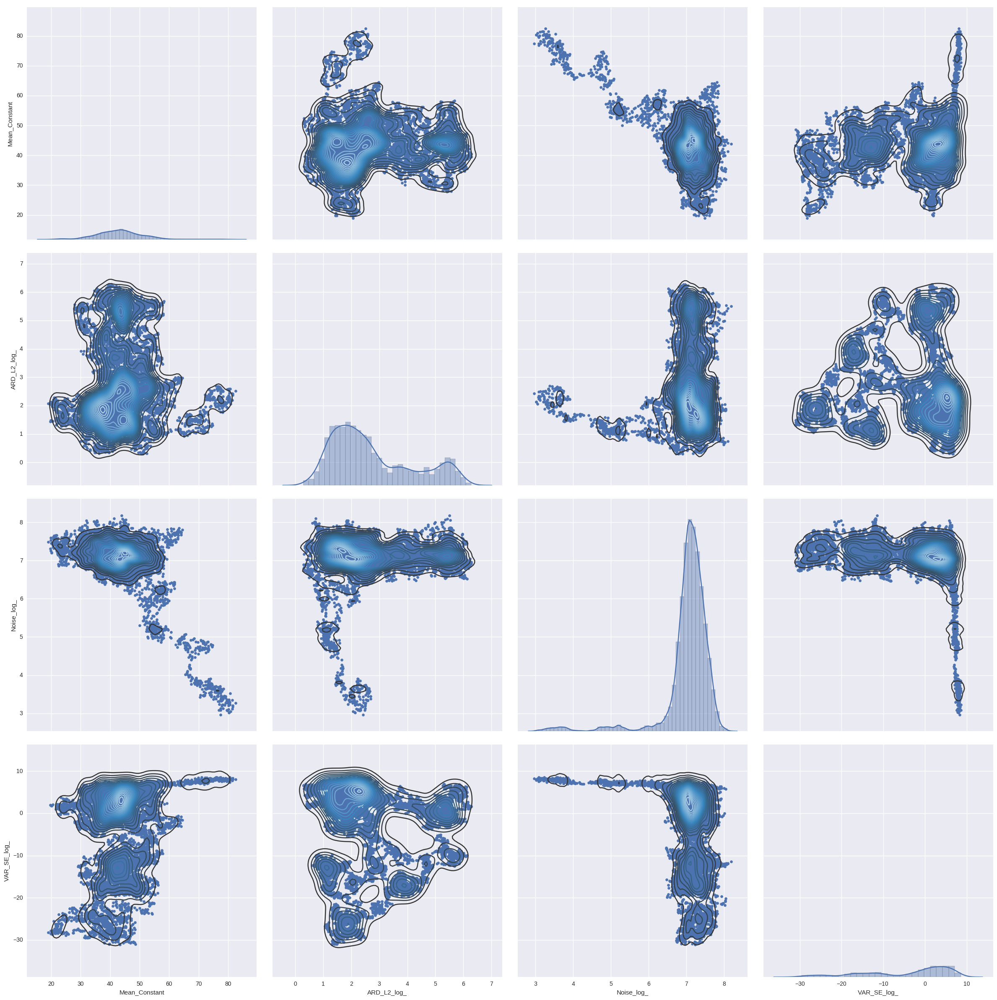

In [165]:
g3.plot_df_items(conditional_traces,items_mt+items_k)

/home/grios/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


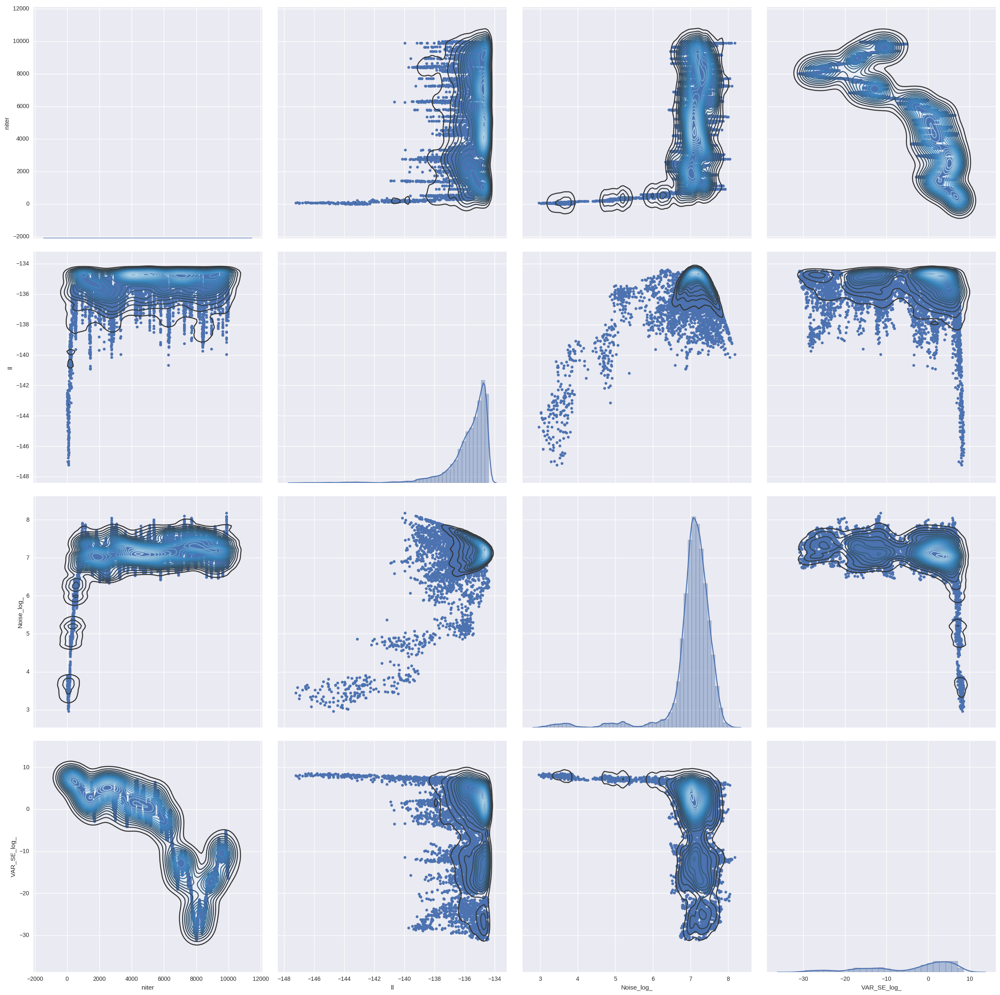

In [166]:
g3.plot_df_items(conditional_traces,items_ll+items_k)

/home/grios/anaconda3/lib/python3.5/site-packages/statsmodels/nonparametric/kdetools.py:20: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  y = X[:m/2+1] + np.r_[0,X[m/2+1:],0]*1j


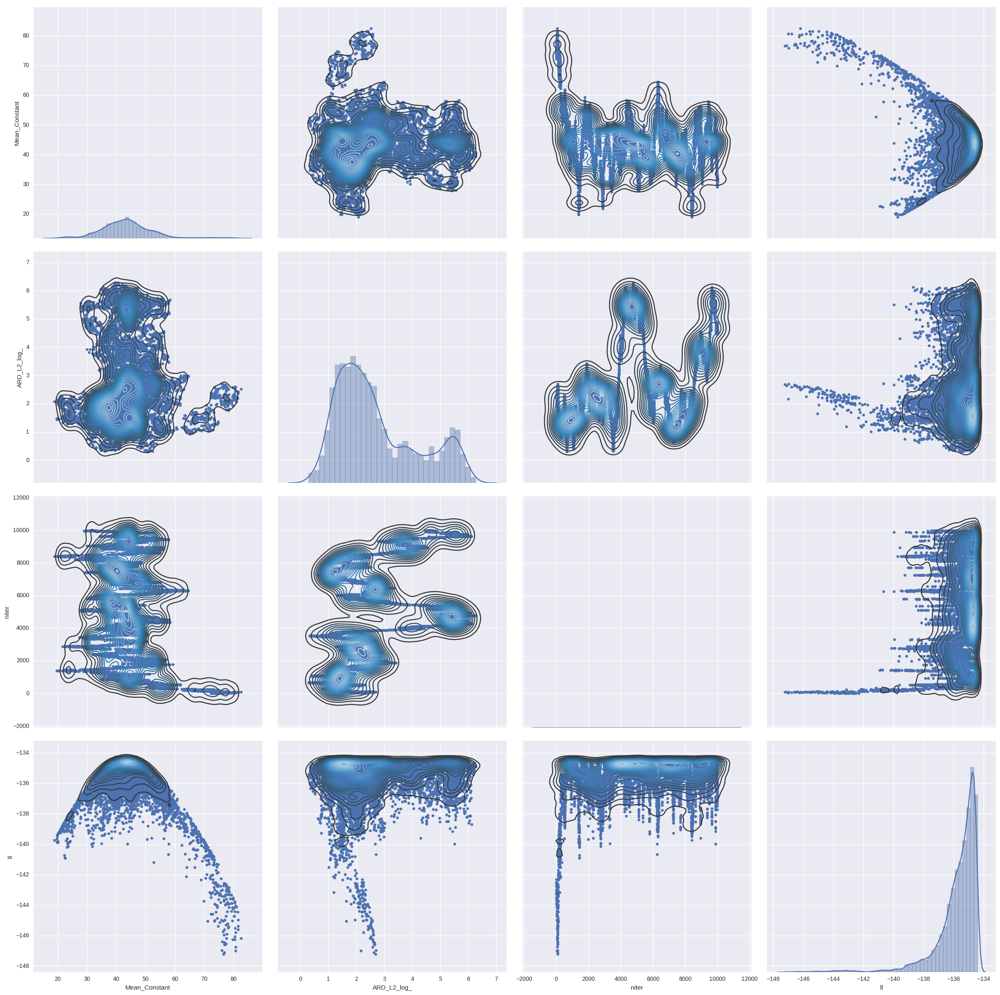

In [167]:
g3.plot_df_items(conditional_traces,items_mt+items_ll)

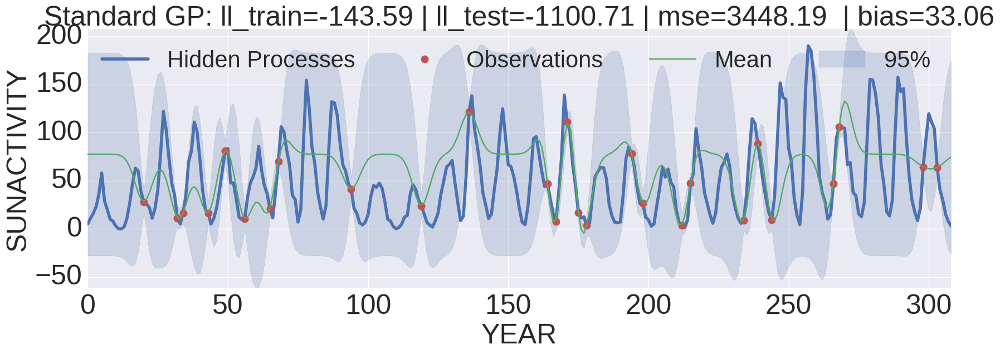

In [168]:
gp.style_big_seaborn()
@interact(idmodel=[0, len(trace)-1])
def plot_model(idmodel=0):
    plot_data()
    plot_gp(model,**get_model(int(idmodel)))

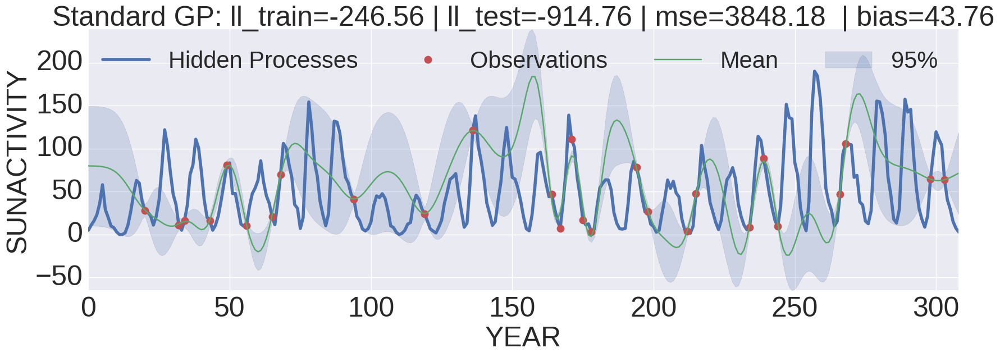

In [169]:
plot_data()
plot_gp(model,**params)

# Box-Cox GP

In [851]:
with gp.G3Model() as model:
    g3 = gp.G3GP(gp.Constant(), gp.SE(gp.ARD_L2(x)), gp.BoxCoxShifted(y))
    g3.observed(x_obs,y_obs)
    mu, var, median, I_up, I_down, m1, m2 = g3.compilate_functions(model.vars,x)
model.use_prior(False)
#gp.show_graph(model.logpt)

Applied log-transform to ARD_L2 and added transformed ARD_L2_log_ to model.
Applied log-transform to COV_SE and added transformed COV_SE_log_ to model.
Applied log-transform to T_Power and added transformed T_Power_log_ to model.


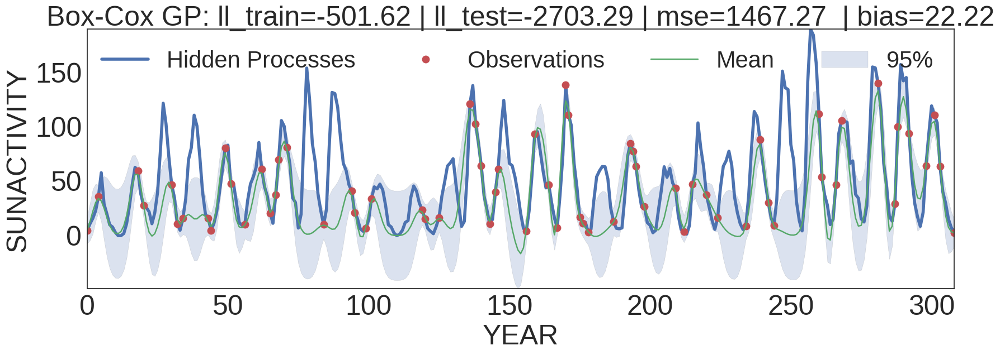

In [852]:
init = {'ARD_L2_log_': np.array(2.5, dtype=np.float32),
         'COV_SE_log_': np.array([ 6, 3 ], dtype=np.float32),
         'Mean_Constant': np.array(2, dtype=np.float32),
         'T_Shift': np.array(1.0, dtype=np.float32),
         'T_Power_log_': np.array(0.0, dtype=np.float32),
       }
plt.figure(0)
plot_data()
plot_tgp(model,**init)

In [853]:
th.config.mode='FAST_COMPILE'

CPU times: user 6.92 s, sys: 17.8 s, total: 24.7 s
Wall time: 3.87 s
CPU times: user 3.66 s, sys: 10.4 s, total: 14.1 s
Wall time: 1.96 s
CPU times: user 6.48 s, sys: 19.2 s, total: 25.7 s
Wall time: 3.47 s
CPU times: user 6.44 s, sys: 19.1 s, total: 25.5 s
Wall time: 3.49 s


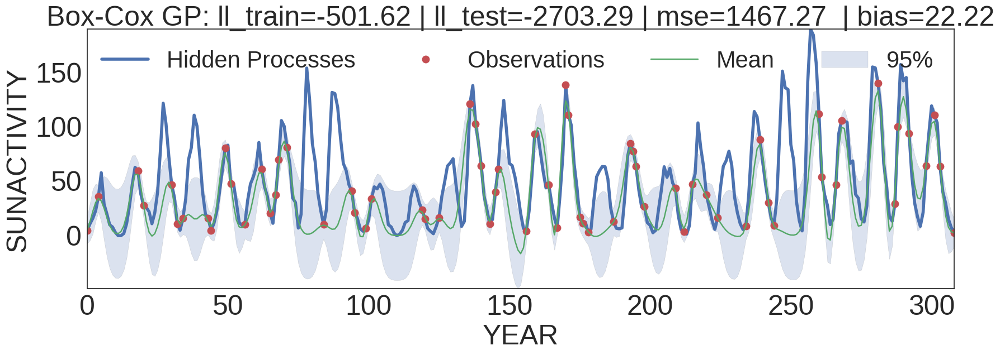

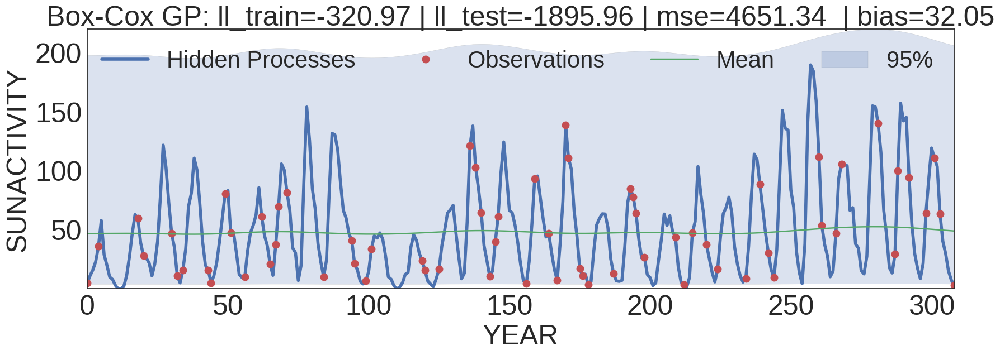

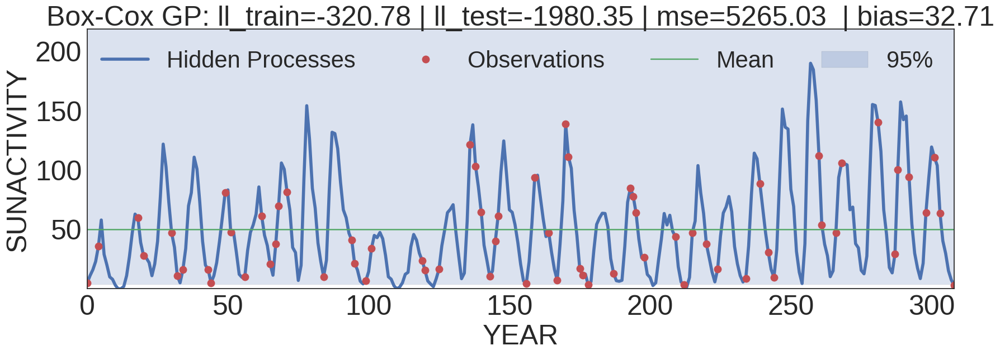

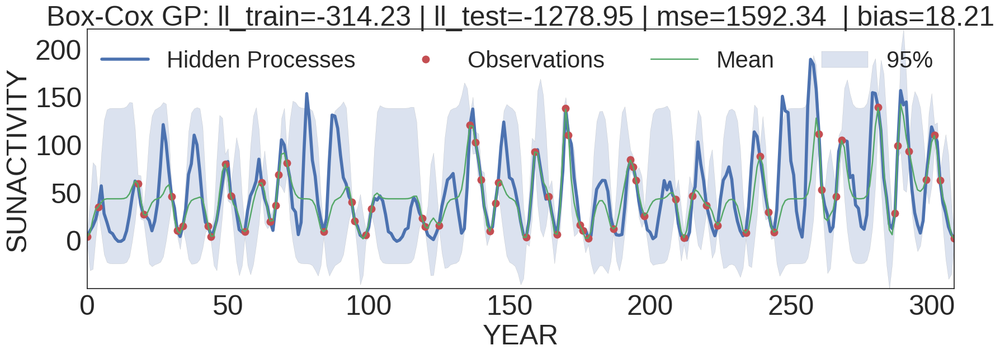

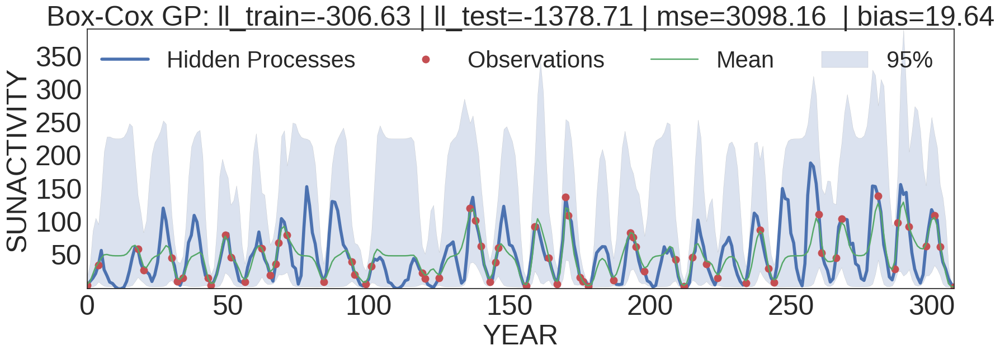

In [854]:
with model:
    #model.use_prior(False)
    %time start_bfgs = pm.find_MAP(fmin=sp.optimize.fmin_bfgs,start=init)
    %time new_bfgs = pm.find_MAP(fmin=sp.optimize.fmin_bfgs,start=start_bfgs,vars=model.COV_SE_log_)
    %time start_powell = pm.find_MAP(fmin=sp.optimize.fmin_powell,start=init)
    %time new_powell = pm.find_MAP(fmin=sp.optimize.fmin_powell,start=start_bfgs)

plt.figure(0)
plot_data()
plot_tgp(model,**init)

plt.figure(1)
plot_data()
plot_tgp(model,**start_bfgs)

plt.figure(2)
plot_data()
plot_tgp(model,**new_bfgs)

plt.figure(3)
plot_data()
plot_tgp(model,**start_powell)

plt.figure(4)
plot_data()
plot_tgp(model,**new_powell)

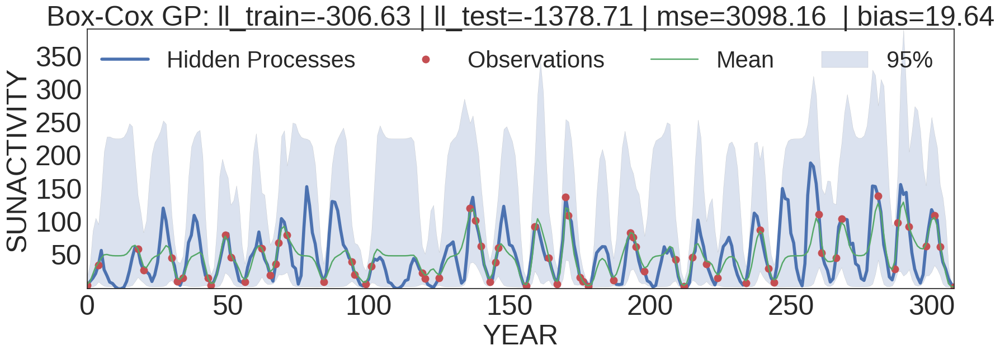

In [855]:
gp.style_big()
params = new_powell

plt.figure(1)
plot_data()
plot_tgp(model,**params)
gp.save('tgp_learning.pdf')

In [856]:
new_powell

{'ARD_L2_log_': array(1.836987853050232, dtype=float32),
 'COV_SE_log_': array([ 1.81526077, -0.1936231 ], dtype=float32),
 'Mean_Constant': array(4.632904529571533, dtype=float32),
 'T_Power_log_': array(-1.5855495929718018, dtype=float32),
 'T_Shift': array(-4.899999618530273, dtype=float32)}

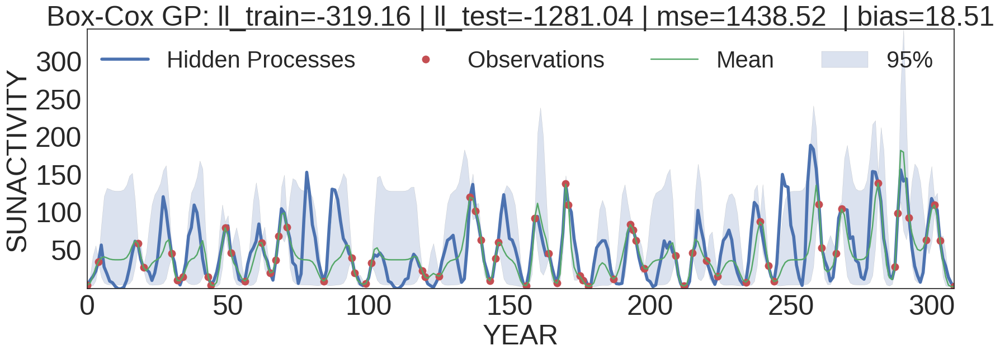

In [857]:
new_powell['COV_SE_log_'][0] = 1.2
new_powell['COV_SE_log_'][1] = -5.0
plot_data()
plot_tgp(model,**params)
gp.save('tgp_learning.pdf')

# Transformación

In [828]:
hidden_var = np.linspace(-10,5,501)
params = {'ARD_L2_log_': np.array(2.5, dtype=np.float32),
         'COV_SE_log_': np.array([ 2, -3 ], dtype=np.float32),
         'Mean_Constant': np.array(3.0, dtype=np.float32),
         'T_Shift': np.array(0.0, dtype=np.float32),
         'T_Power_log_': np.array(-0.4, dtype=np.float32),
       }
trans, dtrans, dist_gp, dist_tgp = g3.compile_distributions(model.point_to_In(params))
params

{'ARD_L2_log_': array(2.5, dtype=float32),
 'COV_SE_log_': array([ 2., -3.], dtype=float32),
 'Mean_Constant': array(3.0, dtype=float32),
 'T_Power_log_': array(-0.4000000059604645, dtype=float32),
 'T_Shift': array(0.0, dtype=float32)}

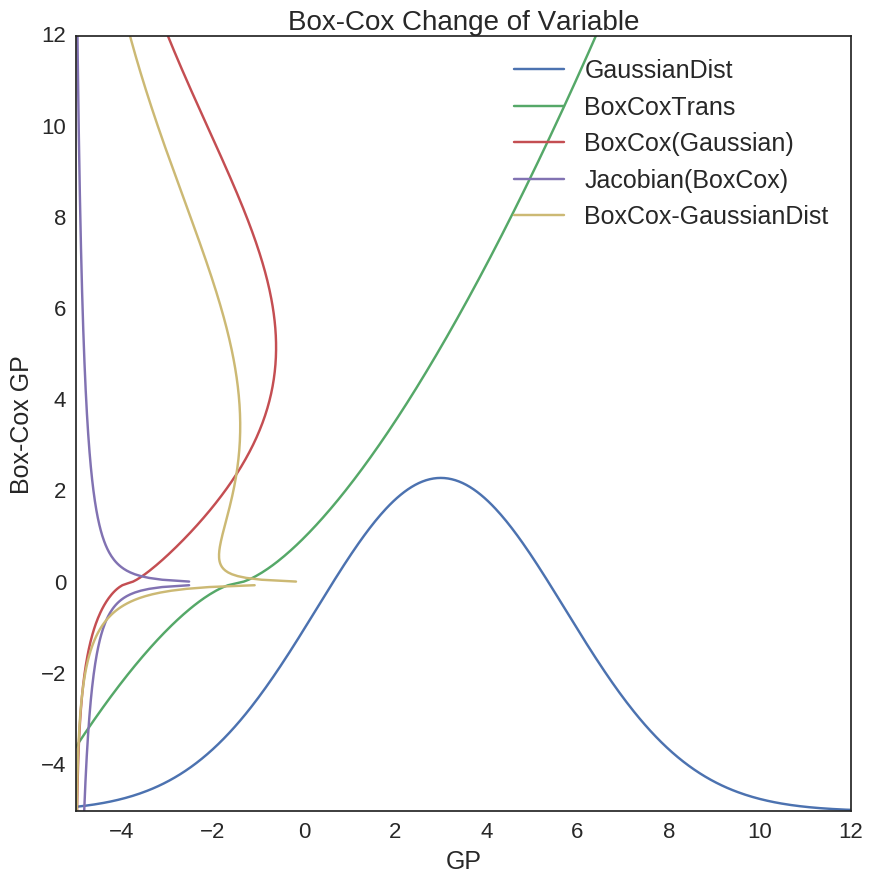

In [829]:
grilla = np.linspace(-5,15,501)
gp.style_normal()
plt.figure(1,(10,10))

desfase = 5


yyy = np.zeros_like(grilla)
i = 0
for xxx in grilla:
    yyy[i] = dist_gp(np.array([xxx]))
    i+=1
plt.plot(grilla,yyy*50-desfase,label='GaussianDist')


plt.plot(trans(grilla),grilla,label='BoxCoxTrans')


yyy = np.zeros_like(grilla)
i = 0
for xxx in trans(grilla):
    yyy[i] = dist_gp(np.array([xxx]))
    i+=1
plt.plot(yyy*30-desfase,grilla,label='BoxCox(Gaussian)')


i = 0
for xxx in grilla:
    yyy[i] = dtrans(np.array([xxx]))
    i+=1
plt.plot((yyy-np.min(yyy))-desfase,grilla,label='Jacobian(BoxCox)')


i = 0
for xxx in grilla:
    yyy[i] = dist_tgp(np.array([xxx]))
    i+=1
plt.plot(yyy*40-desfase,grilla,label='BoxCox-GaussianDist')



#location_gp = grilla[np.argmax(yyy*100)]
#min_gp = np.min(yyy*100)
#max_gp = trans(np.array([location_gp]))
#plt.plot(np.array([location_gp,location_gp]),np.array([min_gp,max_gp]))



gp.plot('Box-Cox Change of Variable','GP','Box-Cox GP',loc=1,ncol=1)
plt.axis([-5,12,-5,12])
gp.save('change_of_variable.pdf')

# Samplear Hiperparámetros

In [226]:
th.config.mode = 'FAST_COMPILE'

In [227]:
with model:
    advi_mu,advi_sm,advi_elbo = pm.advi(start=start_bfgs)

Iteration 0 [0%]: ELBO = -229.73
Iteration 500 [10%]: Average ELBO = -7.77864652816613e+29
Iteration 1000 [20%]: Average ELBO = -1.5050311638199712e+28
Iteration 1500 [30%]: Average ELBO = -11185247295521.37
Iteration 2000 [40%]: Average ELBO = -40955.2
Iteration 2500 [50%]: Average ELBO = -490983.64
Iteration 3000 [60%]: Average ELBO = -630.13
Iteration 3500 [70%]: Average ELBO = -293456.86
Iteration 4000 [80%]: Average ELBO = -290.25
Iteration 4500 [90%]: Average ELBO = -282.27
Finished [100%]: Average ELBO = -263.6


In [228]:
n = 5000
with model:
    step = pm.HamiltonianMC(scaling=advi_sm)
    trace = pm.sample(n,step=step,start=advi_mu)

100%|██████████| 5000/5000 [02:31<00:00, 32.96it/s]


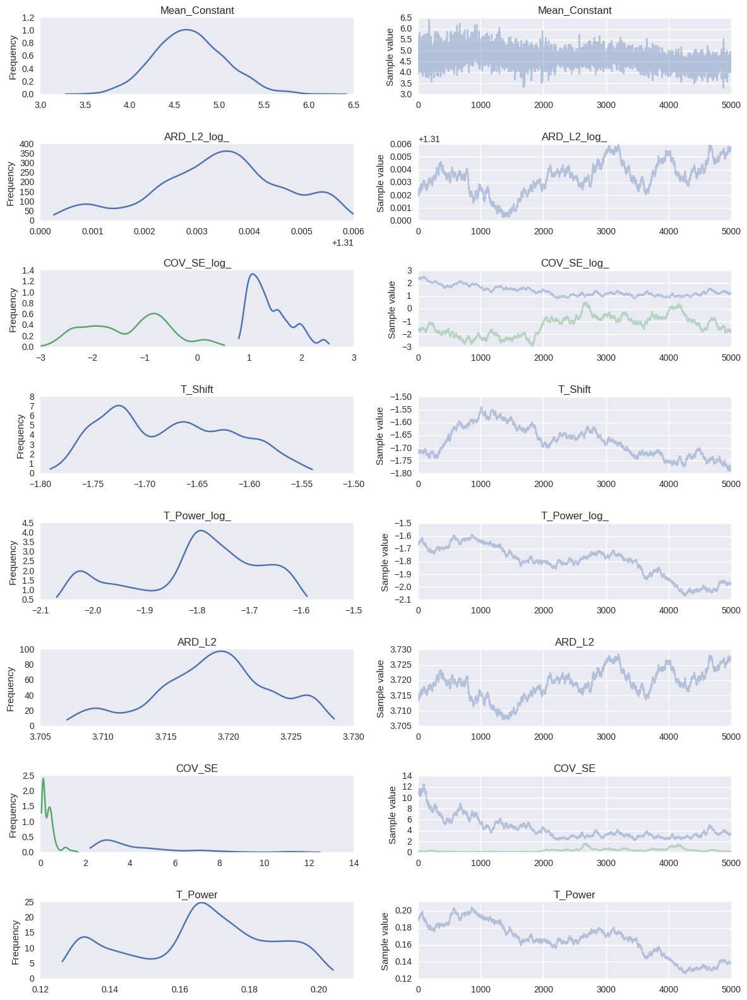

In [229]:
gp.style_seaborn()
_ = pm.traceplot(trace,plot_transformed=True)
def get_model(i):
    return {v.name:trace[i][v.name] for v in model.vars}

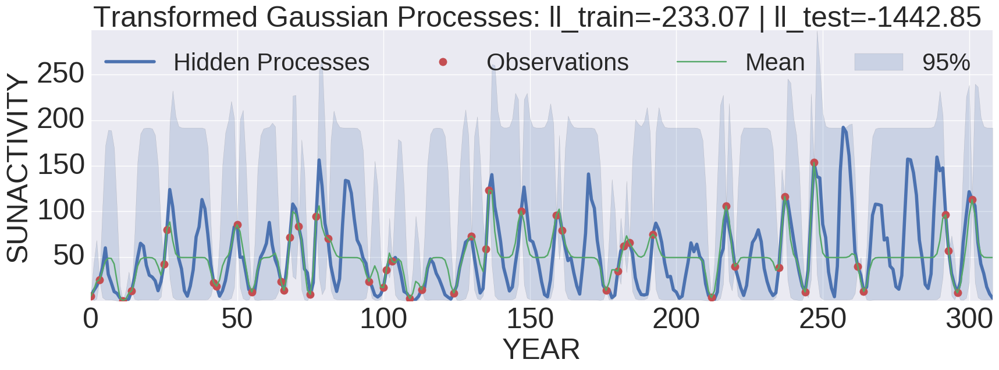

In [230]:
gp.style_big_seaborn()
plot_data()
plot_tgp(model,**start)

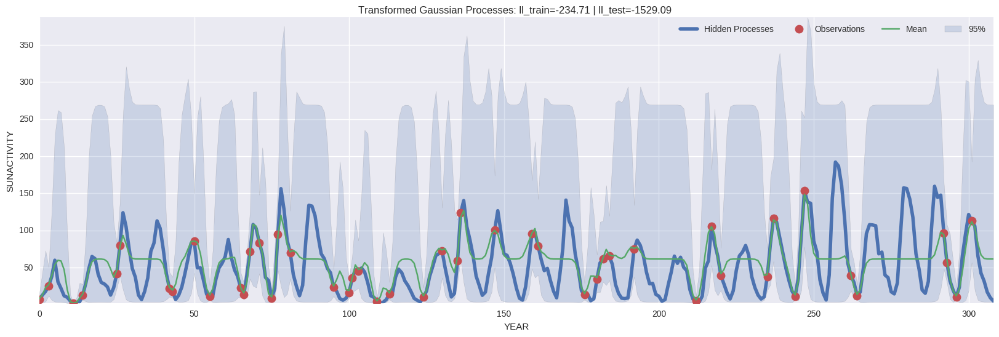

In [231]:
gp.style_big_seaborn()
@interact(idmodel=[0, len(trace)-1])
def plot_model(idmodel=0):
    plot_data()
    plot_tgp(model,**get_model(int(idmodel)))

In [232]:
datatrace = g3.trace_to_dataframe(trace,hide_transformed_vars=False)
gp.add_likelihood_to_dataframe(model,datatrace,trace)
datatrace.describe().T

,count,mean,std,min,25%,50%,75%,max
T_Power,5000.0,0.165822,0.020387,0.126317,0.149749,0.166910,0.180732,0.204064
Mean_Constant,5000.0,4.671268,0.398694,3.281257,4.398845,4.655203,4.927432,6.420544
T_Power_log_,5000.0,-1.804680,0.126441,-2.068962,-1.898798,-1.790301,-1.710742,-1.589319
T_Shift,5000.0,-1.675982,0.059662,-1.790640,-1.726454,-1.677187,-1.626024,-1.539676
ARD_L2_log_,5000.0,1.313417,0.001268,1.310256,1.312643,1.313465,1.314225,1.315989
COV_SE_log___0,5000.0,1.382626,0.383606,0.799344,1.074712,1.279435,1.623119,2.524627
COV_SE_log___1,5000.0,-1.297380,0.776580,-2.984916,-1.969856,-1.148701,-0.734812,0.523547
ARD_L2,5000.0,3.718838,0.004713,3.707124,3.715982,3.719037,3.721865,3.728437
COV_SE__0,5000.0,4.322665,1.959733,2.224082,2.929148,3.594609,5.068875,12.486234
COV_SE__1,5000.0,0.365860,0.293186,0.050544,0.139477,0.317048,0.479596,1.688005


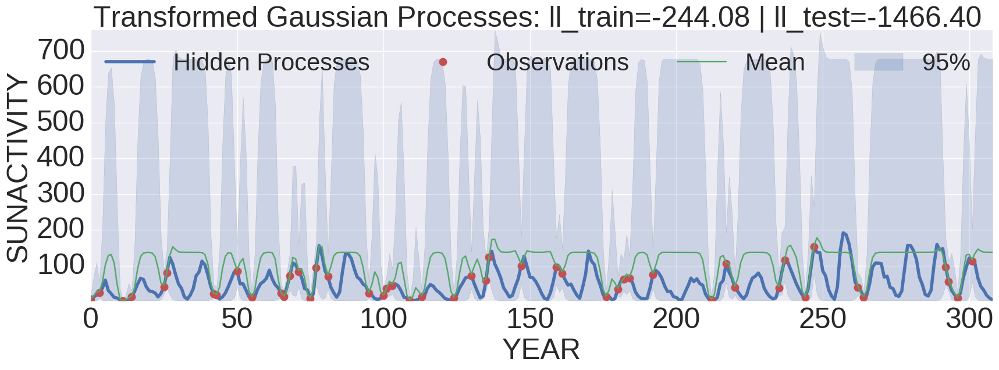

In [235]:
index_sorted = datatrace.sort_values(by='ll').index
gp.style_big_seaborn()
@interact(nmodel=[0, len(trace)-1])
def plot_model(nmodel=0):
    plot_data()
    plot_tgp(model,**get_model(int(index_sorted[nmodel])))

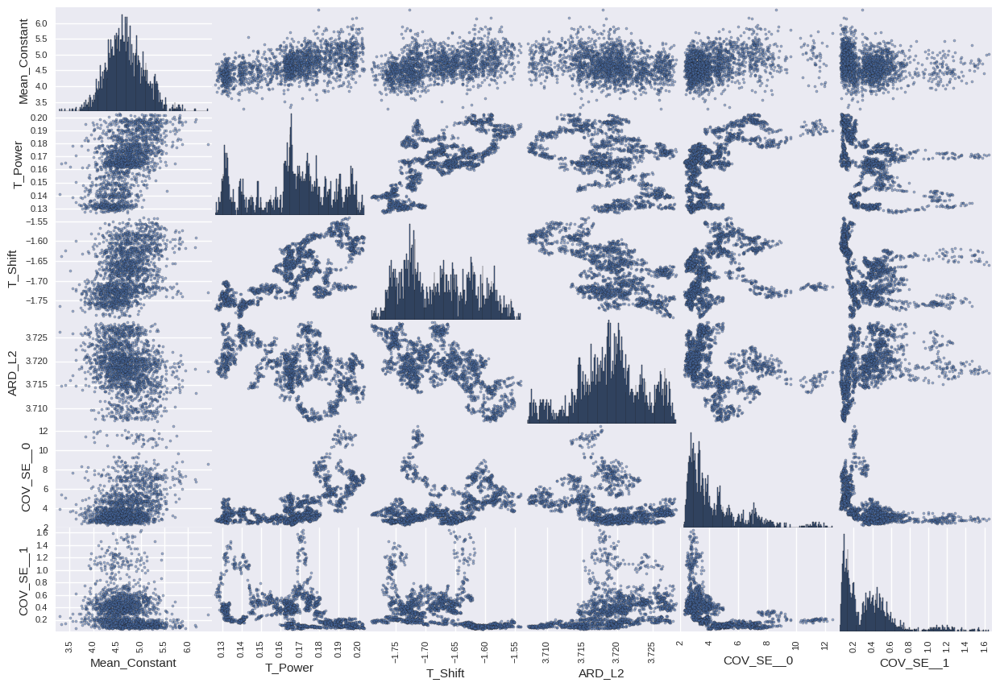

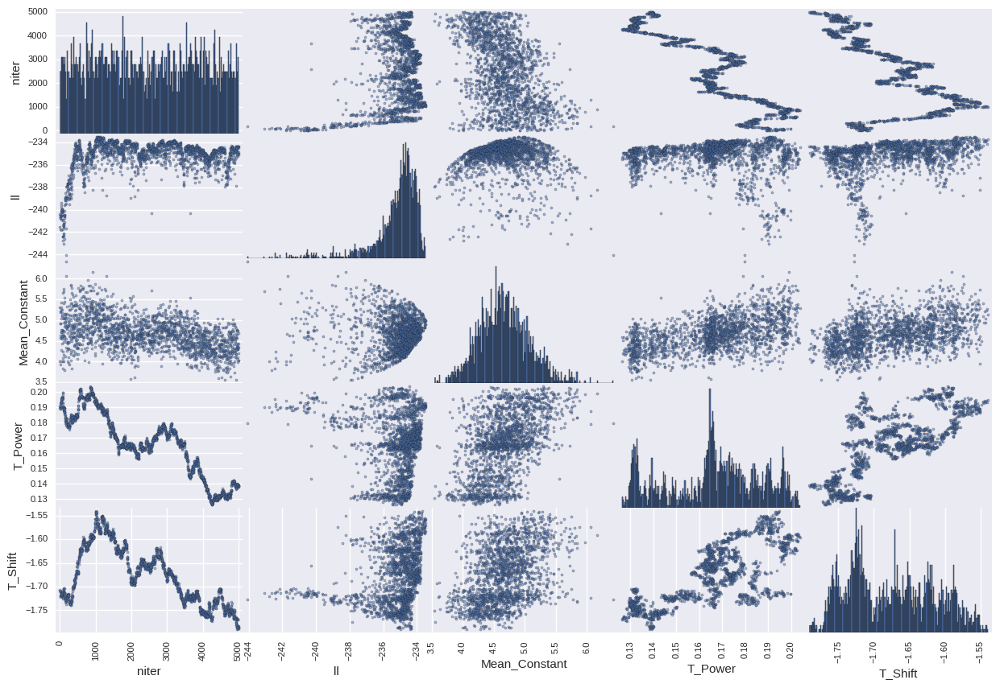

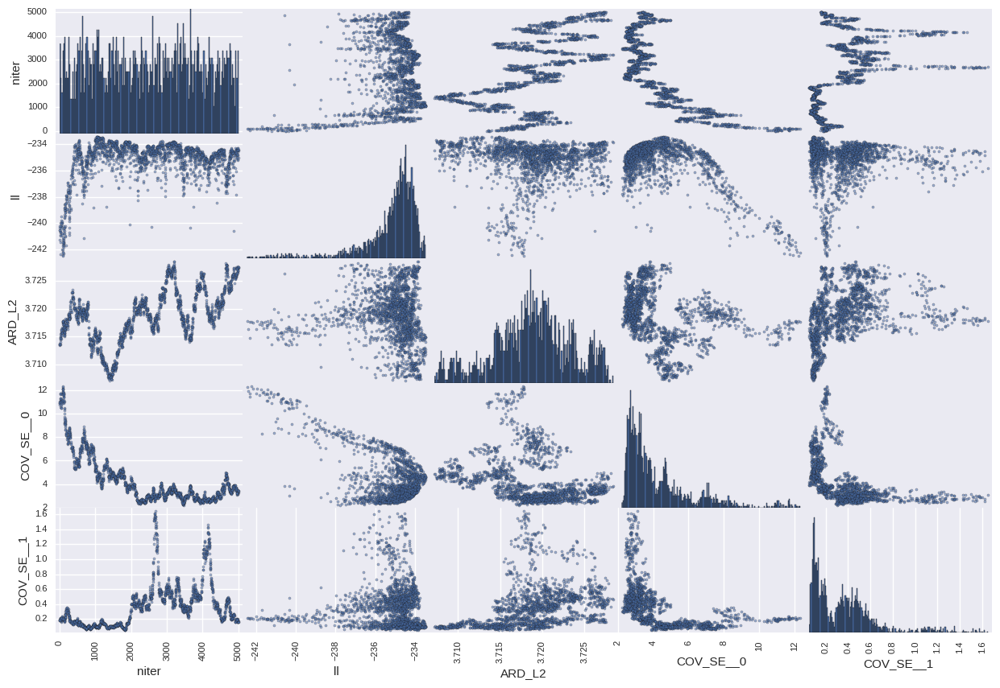

In [234]:
gp.style_seaborn()
items_ll = ['niter','ll']
items_mt = ['Mean_Constant','T_Power','T_Shift']
items_k = ['ARD_L2','COV_SE__0','COV_SE__1']

gp.scatter_trace(datatrace,items=(items_mt+items_k))
gp.scatter_trace(datatrace,items=(items_ll+items_mt))
gp.scatter_trace(datatrace,items=(items_ll+items_k))

In [ ]:
import theano.sandbox.linalg as sT
trans = tt.log(sT.det(tt.jacobian(g3.mapping.inv(value),value)))
ftrans = th.function([value]+model.point_to_In(init),trans,allow_input_downcast=True)
yyy = np.zeros_like(grilla)
i = 0
for xxx in grilla:
    yyy[i] = ftrans(np.array([xxx]))
    i+=1
plt.plot(grilla,yyy)